# Table of contents

### Importing Libraries and settings

In [2]:
# For data cleaning and EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import random as rnd
import plotly.express as px 

# Machine Learning algorithms
from sklearn import datasets
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC

import datetime

# To print multiple outputs in a single cell

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Plot settings

sns.set(rc={"figure.dpi":100, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")
from IPython.display import set_matplotlib_formats
# set_matplotlib_formats('retina')
%config InlineBackend.figure_format = 'retina'
plt.style.use('tableau-colorblind10')

# Create a Plotly color scale
plotly_color_scale = px.colors.qualitative.Plotly
# Create a custom color palette using Plotly colors
custom_colors = plotly_color_scale

In [3]:
compiled = pd.read_csv('../../data/preprocessing_data/compiled_part_1_end.csv')
compiled

/var/folders/27/b03t8q596qvcmtyqjtnh0w6w0000gn/T/ipykernel_28327/687019336.py:1: DtypeWarning: Columns (31) have mixed types. Specify dtype option on import or set low_memory=False.
  compiled = pd.read_csv('../../data/preprocessing_data/compiled_part_1_end.csv')


,Unnamed: 0,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,...,NH3,CO2,O3,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
0,0,2020-03-04 00:00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.50,3.01,5.08,...,NaN,NaN,NaN,NaN,NaN,4,3,2020,10,0
1,1,2020-03-04 01:00:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,...,NaN,NaN,NaN,NaN,NaN,4,3,2020,10,1
2,2,2020-03-04 02:00:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.60,1.85,12.72,...,NaN,NaN,NaN,NaN,NaN,4,3,2020,10,2
3,3,2020-03-04 03:00:00,Vikas Sadan,67.60,377.93,29.18,317.53,10.53,1.31,11.46,...,NaN,NaN,NaN,NaN,NaN,4,3,2020,10,3
4,4,2020-03-04 04:00:00,Vikas Sadan,72.72,319.80,33.66,273.25,9.98,0.63,4.76,...,NaN,NaN,NaN,NaN,NaN,4,3,2020,10,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147526,147526,2020-06-30 20:00:00,No Station,54.74,6.23,10.67,12.60,4.18,0.60,NaN,...,2.95,NaN,70.95,154.0,Moderate,30,6,2020,27,20
147527,147527,2020-06-30 21:00:00,No Station,54.37,6.30,10.28,11.88,4.03,1.20,NaN,...,3.47,NaN,55.13,154.0,Moderate,30,6,2020,27,21
147528,147528,2020-06-30 22:00:00,No Station,50.34,6.93,10.36,13.01,6.17,1.00,NaN,...,3.76,NaN,42.60,155.0,Moderate,30,6,2020,27,22
147529,147529,2020-06-30 23:00:00,No Station,53.23,6.64,10.30,12.75,6.31,0.86,NaN,...,3.36,NaN,35.61,156.0,Moderate,30,6,2020,27,23


In [4]:
compiled.drop(['Unnamed: 0'], axis=1, inplace=True)

In [11]:
compiled['Datetime'] = pd.to_datetime(compiled['Datetime'])

In [12]:
compiled

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
0,2020-03-04 00:00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.50,3.01,5.08,2.04,0.0,NaN,NaN,NaN,4,3,2020,10,0
1,2020-03-04 01:00:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,2.00,0.0,NaN,NaN,NaN,4,3,2020,10,1
2,2020-03-04 02:00:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.60,1.85,12.72,2.02,0.0,NaN,NaN,NaN,4,3,2020,10,2
3,2020-03-04 03:00:00,Vikas Sadan,67.60,377.93,29.18,317.53,10.53,1.31,11.46,1.96,0.0,NaN,NaN,NaN,4,3,2020,10,3
4,2020-03-04 04:00:00,Vikas Sadan,72.72,319.80,33.66,273.25,9.98,0.63,4.76,2.01,0.0,NaN,NaN,NaN,4,3,2020,10,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147526,2020-06-30 20:00:00,No Station,54.74,6.23,10.67,12.60,4.18,0.60,NaN,2.14,NaN,135.42,154.0,Moderate,30,6,2020,27,20
147527,2020-06-30 21:00:00,No Station,54.37,6.30,10.28,11.88,4.03,1.20,NaN,1.87,NaN,136.11,154.0,Moderate,30,6,2020,27,21
147528,2020-06-30 22:00:00,No Station,50.34,6.93,10.36,13.01,6.17,1.00,NaN,2.41,NaN,147.32,155.0,Moderate,30,6,2020,27,22
147529,2020-06-30 23:00:00,No Station,53.23,6.64,10.30,12.75,6.31,0.86,NaN,2.54,NaN,163.15,156.0,Moderate,30,6,2020,27,23


## Removing columns where missing % is >40

In [6]:
compiled.drop(['Toluene', 'Eth-Benzene', 'MP-Xylene', 'O', 'Temp', 'RH', 'WS', 'WD', 'SR', 'BP', 'VWS', 'Xylene', 'AT', 'RF', 'NH3', 'CO2', 'O3'], axis = 1, inplace=True)

In [7]:
compiled["AQI_Bucket"].value_counts()

Moderate        10271
Very Poor        8489
Poor             6326
Satisfactory     5552
Severe           2180
Good              602
Name: AQI_Bucket, dtype: int64

In [8]:
compiled["AQI"].value_counts(dropna=False)

NaN      114111
100.0       171
92.0        171
76.0        169
142.0       168
          ...  
747.0         1
728.0         1
581.0         1
640.0         1
580.0         1
Name: AQI, Length: 679, dtype: int64

In [9]:
px.bar(compiled.groupby(['Station']).apply(lambda x : round(((x.isnull().sum() + (x=="nan").sum())/compiled.shape[0])*100, 2) ).T, text_auto=True)

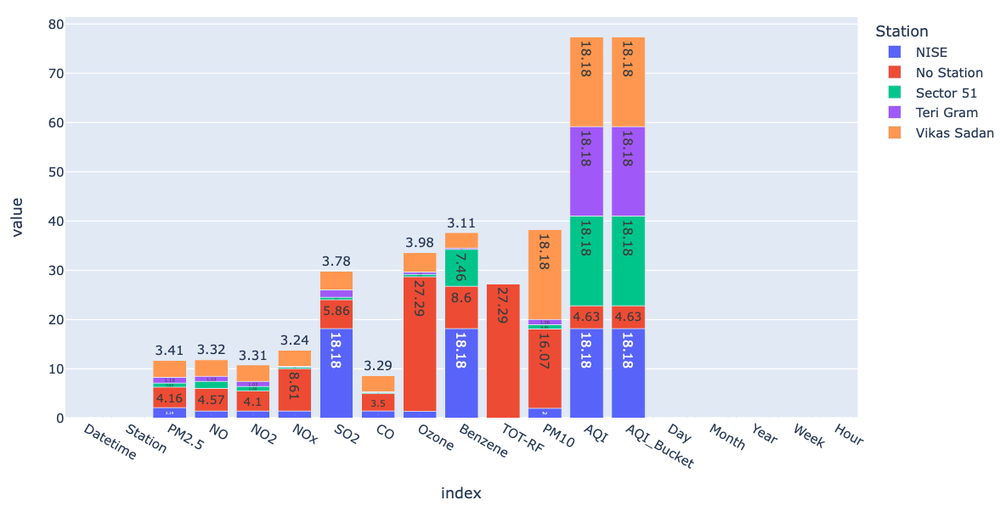

## Exploring PM2.5

<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='PM2.5'>

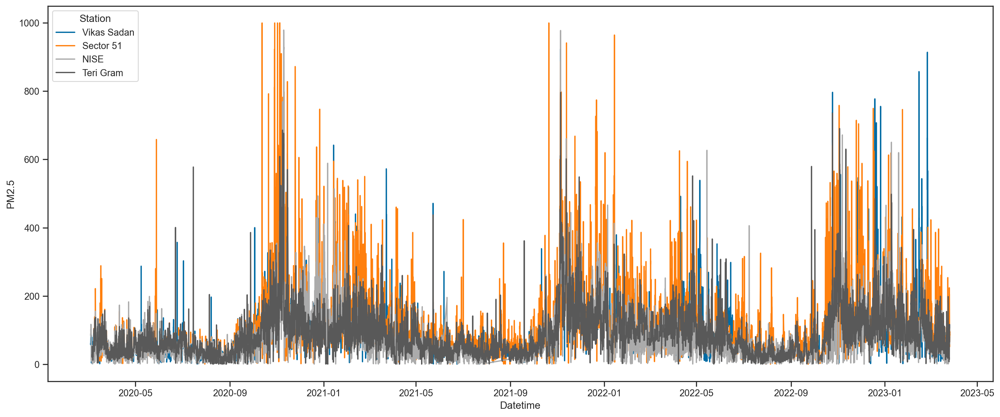

In [13]:
plt.figure(figsize=(20,8))
sns.lineplot(data=compiled[:107273], x="Datetime", y="PM2.5", hue="Station")

<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='PM2.5'>

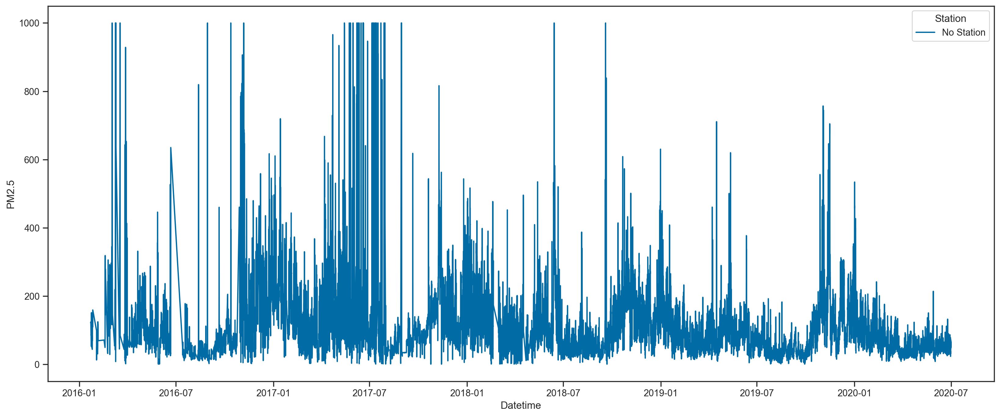

In [14]:
plt.figure(figsize=(20,8))
sns.lineplot(data=compiled[107273:], x="Datetime", y="PM2.5", hue="Station")

In [16]:
def helper_2(df, col):
    
    df_na = df[df[col].isna()]
    
    df_na.fillna(1).groupby(by=['Year', "Month", "Station"]).count()
    
    df_na_col_count = df_na.fillna(1).groupby(
        by=['Year', "Month", "Station"])[col].count().reset_index()
    
    df_na_col_count["Year_Month"] = df_na_col_count["Year"].map(
        str) + ", " + df_na_col_count["Month"].map(str)

    return df_na_col_count

In [17]:
col = "PM2.5"
px.bar(data_frame = helper_2(compiled.copy(deep=True), col),
       x = "Year_Month",
       y = col,
       color="Station",
       text_auto = True,
       title = "No. of missing values in "+ col
       )

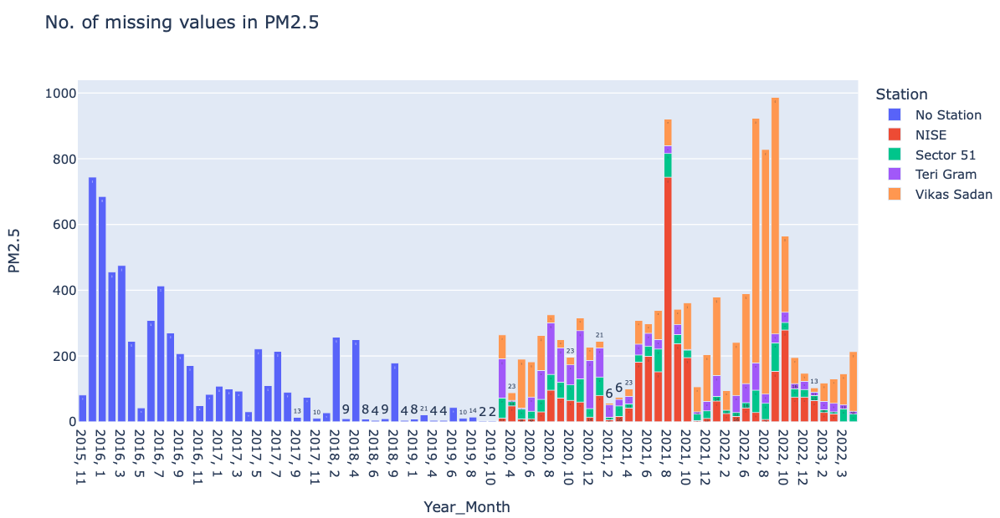

<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='PM2.5'>

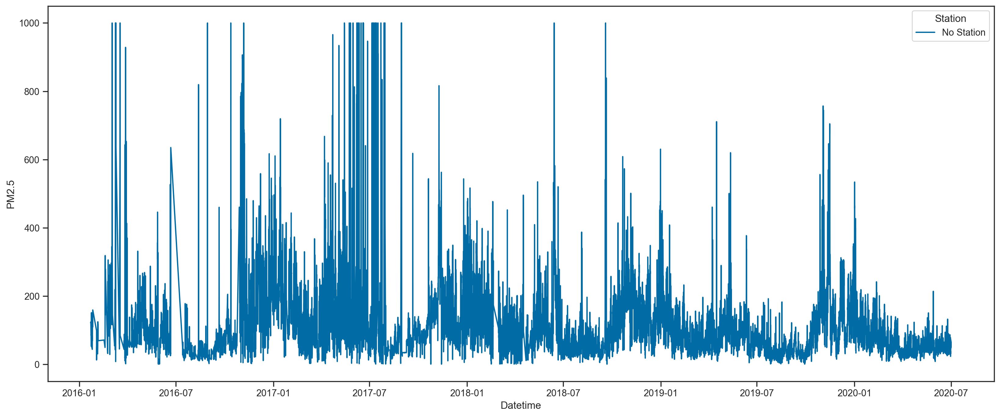

In [18]:
# Let's look year wise

plt.figure(figsize=(20,8))
sns.lineplot(data=compiled[107273:], x="Datetime", y="PM2.5", hue="Station")

In [19]:
compiled.groupby(["Year"]).count()

# Since datetime has no missing values, we can consider it.

year_wise_count = compiled.groupby(["Year"])["Datetime"].count()
year_wise_count

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Week,Hour
Year,,,,,,,,,,,,,,,,,,
2015,825,825,0,454,455,455,452,403,0,0,0,0,0,0,825,825,825,825
2016,8784,8784,5381,4647,5043,4041,6087,5098,0,1108,0,0,5113,5113,8784,8784,8784,8784
2017,8760,8760,7671,7613,7881,1623,7577,7997,0,7924,0,10,7393,7393,8760,8760,8760,8760
2018,8760,8760,8041,7865,7840,8463,5481,8588,0,6056,0,4799,7921,7921,8760,8760,8760,8760
2019,8760,8760,8652,8564,8615,8605,7767,8640,0,8209,0,7380,8624,8624,8760,8760,8760,8760
2020,33457,33457,31157,30511,31274,32461,24572,32483,27123,25322,29088,24625,4369,4369,33457,33457,33457,33457
2021,35040,35040,31685,32390,32383,32727,25066,32717,32398,22682,35040,23613,0,0,35040,35040,35040,35040
2022,35040,35040,29932,30073,30139,30840,20885,30964,30579,14719,35040,24827,0,0,35040,35040,35040,35040
2023,8105,8105,7755,7971,7983,8001,5648,7937,7832,5997,8105,5915,0,0,8105,8105,8105,8105


Year
2015      825
2016     8784
2017     8760
2018     8760
2019     8760
2020    33457
2021    35040
2022    35040
2023     8105
Name: Datetime, dtype: int64

In [20]:
compiled[compiled['Year'] == 2015]
compiled[compiled['Year'] == 2016]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
107273,2015-11-27 15:00:00,No Station,NaN,NaN,12.50,5.85,NaN,0.08,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,15
107274,2015-11-27 16:00:00,No Station,NaN,4.02,10.03,10.34,8.38,1.40,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,16
107275,2015-11-27 17:00:00,No Station,NaN,11.25,7.07,15.14,16.69,1.75,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,17
107276,2015-11-27 18:00:00,No Station,NaN,4.55,7.06,8.44,18.85,2.91,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,18
107277,2015-11-27 19:00:00,No Station,NaN,5.68,7.80,9.67,21.52,4.58,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108093,2015-12-31 19:00:00,No Station,NaN,10.36,12.07,13.12,3.68,2.05,NaN,NaN,NaN,NaN,NaN,NaN,31,12,2015,53,19
108094,2015-12-31 20:00:00,No Station,NaN,11.22,21.07,13.74,4.07,1.37,NaN,NaN,NaN,NaN,NaN,NaN,31,12,2015,53,20
108095,2015-12-31 21:00:00,No Station,NaN,15.37,13.01,16.17,8.63,1.39,NaN,NaN,NaN,NaN,NaN,NaN,31,12,2015,53,21
108096,2015-12-31 22:00:00,No Station,NaN,5.17,15.99,11.18,11.13,1.54,NaN,NaN,NaN,NaN,NaN,NaN,31,12,2015,53,22


,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
108098,2016-01-01 00:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,0
108099,2016-01-01 01:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,1
108100,2016-01-01 02:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,2
108101,2016-01-01 03:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,3
108102,2016-01-01 04:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116877,2016-12-31 19:00:00,No Station,183.79,7.47,10.49,NaN,3.88,22.74,NaN,2.67,NaN,NaN,379.0,Very Poor,31,12,2016,52,19
116878,2016-12-31 20:00:00,No Station,201.53,7.86,10.24,NaN,2.36,27.72,NaN,2.89,NaN,NaN,379.0,Very Poor,31,12,2016,52,20
116879,2016-12-31 21:00:00,No Station,233.52,7.47,10.24,NaN,3.41,35.21,NaN,1.89,NaN,NaN,407.0,Severe,31,12,2016,52,21
116880,2016-12-31 22:00:00,No Station,268.24,7.47,10.27,NaN,3.96,34.39,NaN,4.22,NaN,NaN,407.0,Severe,31,12,2016,52,22


In [21]:
abs(compiled[compiled['Year'] == 2015].index[0] - compiled[compiled['Year'] == 2016].index[0])
year_wise_count[2015]

825

825

### 2015 - PM2.5

In [22]:
compiled_2015 = compiled[compiled['Year'] == 2015]
compiled_2015
compiled_2015.columns

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
107273,2015-11-27 15:00:00,No Station,NaN,NaN,12.50,5.85,NaN,0.08,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,15
107274,2015-11-27 16:00:00,No Station,NaN,4.02,10.03,10.34,8.38,1.40,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,16
107275,2015-11-27 17:00:00,No Station,NaN,11.25,7.07,15.14,16.69,1.75,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,17
107276,2015-11-27 18:00:00,No Station,NaN,4.55,7.06,8.44,18.85,2.91,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,18
107277,2015-11-27 19:00:00,No Station,NaN,5.68,7.80,9.67,21.52,4.58,NaN,NaN,NaN,NaN,NaN,NaN,27,11,2015,48,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108093,2015-12-31 19:00:00,No Station,NaN,10.36,12.07,13.12,3.68,2.05,NaN,NaN,NaN,NaN,NaN,NaN,31,12,2015,53,19
108094,2015-12-31 20:00:00,No Station,NaN,11.22,21.07,13.74,4.07,1.37,NaN,NaN,NaN,NaN,NaN,NaN,31,12,2015,53,20
108095,2015-12-31 21:00:00,No Station,NaN,15.37,13.01,16.17,8.63,1.39,NaN,NaN,NaN,NaN,NaN,NaN,31,12,2015,53,21
108096,2015-12-31 22:00:00,No Station,NaN,5.17,15.99,11.18,11.13,1.54,NaN,NaN,NaN,NaN,NaN,NaN,31,12,2015,53,22


Index(['Datetime', 'Station', 'PM2.5', 'NO', 'NO2', 'NOx', 'SO2', 'CO',
       'Ozone', 'Benzene', 'TOT-RF', 'PM10', 'AQI', 'AQI_Bucket', 'Day',
       'Month', 'Year', 'Week', 'Hour'],
      dtype='object')

In [23]:
# plt.figure(figsize=(20, 8))
# sns.lineplot(data=compiled_2015, x="Datetime", y="PM2.5", hue="Station")

# Getting error because in 2015, PM2.5 has all missing values or no values (refer to year_wise_count)

In [24]:
col = "PM2.5"
px.bar(data_frame = helper_2(compiled_2015.copy(deep=True), col),
       x = "Year_Month",
       y = col,
       color="Station",
       text_auto = True,
       title = "No. of missing values in "+ col +" in 2015"
       )

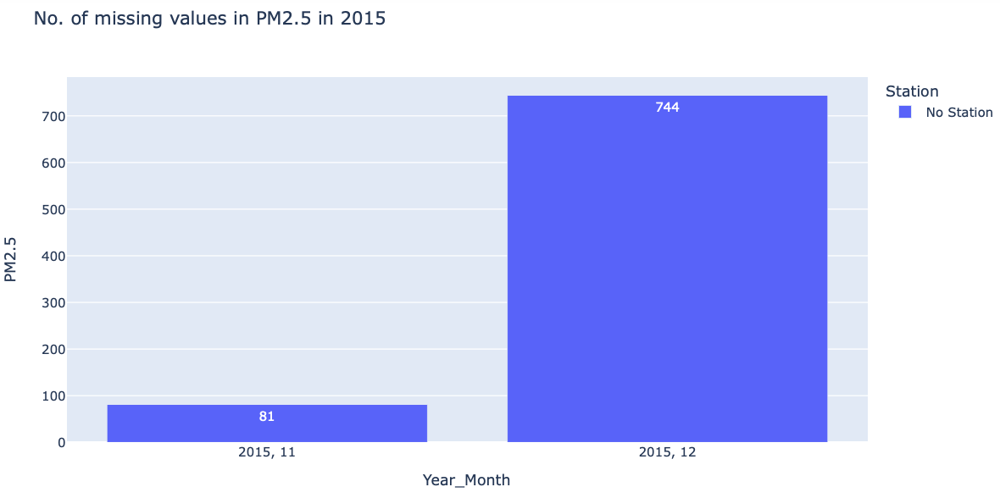

### PM2.5 - 2016

In [25]:
compiled_2016 = compiled[compiled['Year'] == 2016]
compiled_2016
compiled_2016.columns

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
108098,2016-01-01 00:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,0
108099,2016-01-01 01:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,1
108100,2016-01-01 02:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,2
108101,2016-01-01 03:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,3
108102,2016-01-01 04:00:00,No Station,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,2016,53,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116877,2016-12-31 19:00:00,No Station,183.79,7.47,10.49,NaN,3.88,22.74,NaN,2.67,NaN,NaN,379.0,Very Poor,31,12,2016,52,19
116878,2016-12-31 20:00:00,No Station,201.53,7.86,10.24,NaN,2.36,27.72,NaN,2.89,NaN,NaN,379.0,Very Poor,31,12,2016,52,20
116879,2016-12-31 21:00:00,No Station,233.52,7.47,10.24,NaN,3.41,35.21,NaN,1.89,NaN,NaN,407.0,Severe,31,12,2016,52,21
116880,2016-12-31 22:00:00,No Station,268.24,7.47,10.27,NaN,3.96,34.39,NaN,4.22,NaN,NaN,407.0,Severe,31,12,2016,52,22


Index(['Datetime', 'Station', 'PM2.5', 'NO', 'NO2', 'NOx', 'SO2', 'CO',
       'Ozone', 'Benzene', 'TOT-RF', 'PM10', 'AQI', 'AQI_Bucket', 'Day',
       'Month', 'Year', 'Week', 'Hour'],
      dtype='object')

In [26]:
col = "PM2.5"
px.bar(data_frame = helper_2(compiled_2016.copy(deep=True), col),
       x = "Year_Month",
       y = col,
       color="Station",
       text_auto = True,
       title = "No. of missing values in "+ col + " in 2016"
       )

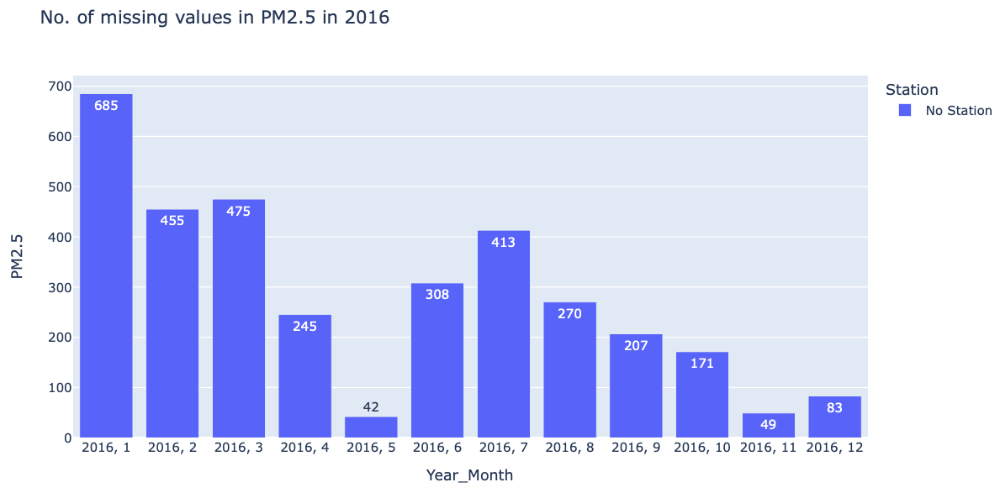

<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='PM2.5'>

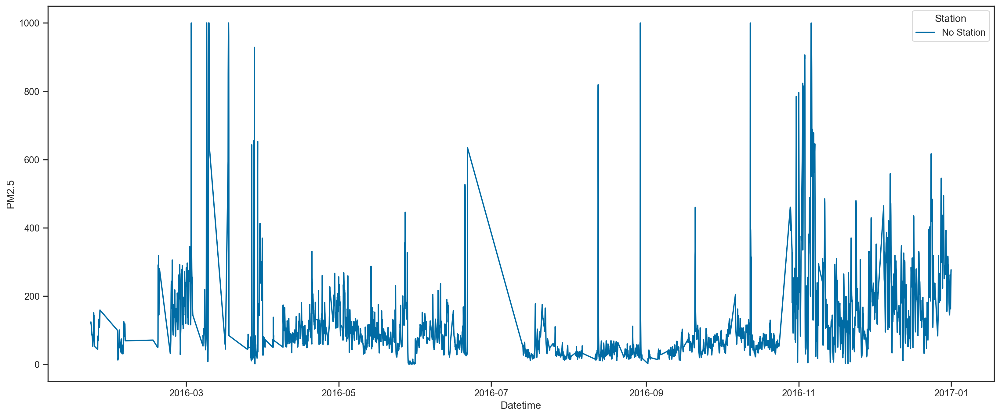

In [27]:
plt.figure(figsize=(20, 8))
sns.lineplot(data=compiled_2016, x="Datetime", y="PM2.5", hue="Station", markers=['o']) 

# Seaborn fills missing values
# There are no gaps in between for mising values

# Getting error because in 2015, PM2.5 has all missing values or no values (refer to year_wise_count)

<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='PM2.5'>

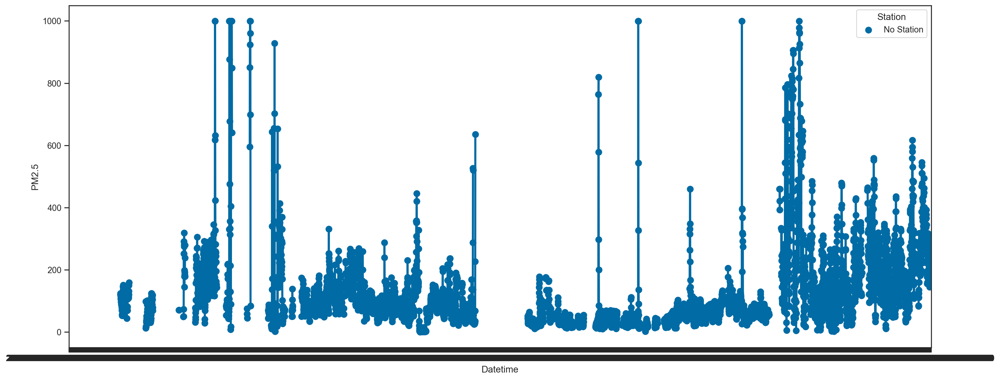

In [28]:
plt.figure(figsize=(20, 8))
sns.pointplot(data=compiled_2016, x="Datetime", y="PM2.5", hue="Station") 

<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='PM2.5'>

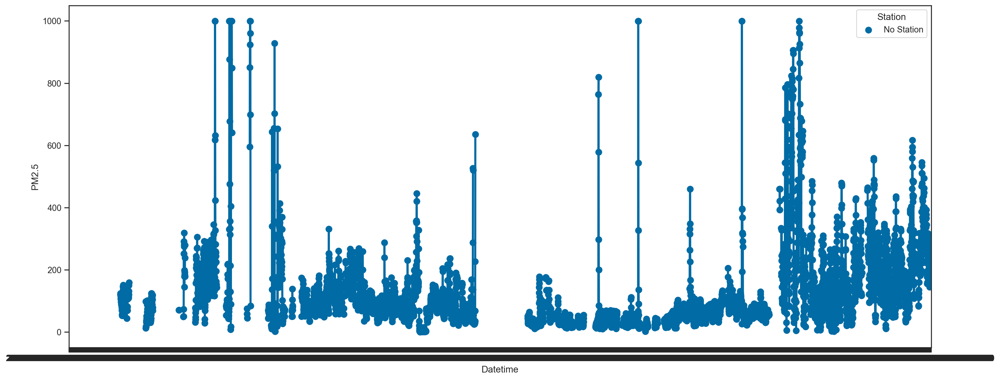

In [29]:
plt.figure(figsize=(20, 8))
sns.pointplot(data=compiled_2016, x="Datetime", y="PM2.5", hue="Station", dodge=True) 

#### Total data points in the graph
- Each day has 24 data points
- Each year has 365 days
- Total data points = 365 * 24 = 8760

In [30]:
px.line(data_frame=compiled_2016, x="Datetime", y="PM2.5")

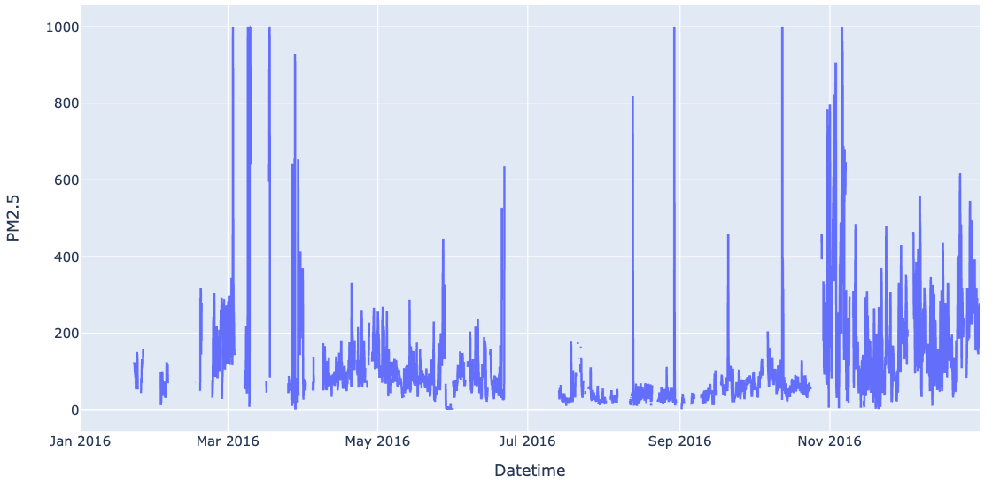

In [31]:
px.line(data_frame=compiled_2016, x="Datetime", y="PM2.5", color="Station")

In [32]:
px.line(data_frame=compiled_2016.bfill(), x="Datetime", y="PM2.5")

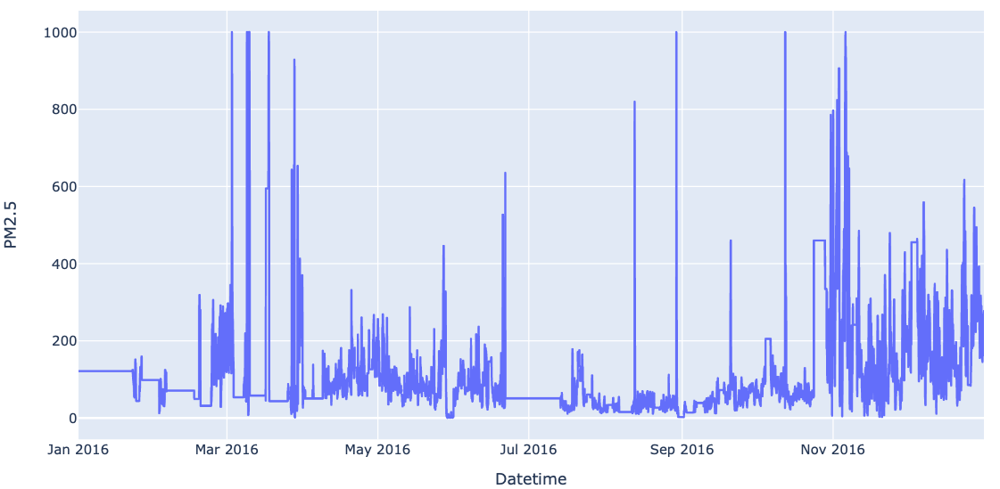

### PM2.5 - 2022

In [33]:
compiled_2022 = compiled[compiled['Year'] == 2022]
compiled_2022
compiled_2022.columns

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
16032,2022-01-01 00:00:00,Vikas Sadan,269.20,346.11,70.77,305.94,16.88,2.23,21.21,4.01,0.0,NaN,NaN,NaN,1,1,2022,52,0
16033,2022-01-01 01:00:00,Vikas Sadan,295.80,188.91,58.07,173.53,15.57,1.47,62.39,4.01,0.0,NaN,NaN,NaN,1,1,2022,52,1
16034,2022-01-01 02:00:00,Vikas Sadan,279.52,233.19,45.33,202.29,18.98,1.91,8.98,3.99,0.0,NaN,NaN,NaN,1,1,2022,52,2
16035,2022-01-01 03:00:00,Vikas Sadan,252.35,167.72,46.35,150.44,10.58,1.28,5.71,3.97,0.0,NaN,NaN,NaN,1,1,2022,52,3
16036,2022-01-01 04:00:00,Vikas Sadan,212.05,114.69,45.33,107.49,8.38,1.29,22.10,4.02,0.0,NaN,NaN,NaN,1,1,2022,52,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105244,2022-12-31 19:00:00,Teri Gram,85.25,9.74,24.48,20.60,9.14,0.63,10.70,6.40,0.0,172.40,NaN,NaN,31,12,2022,52,19
105245,2022-12-31 20:00:00,Teri Gram,83.28,10.68,24.78,21.51,2.45,0.71,11.32,6.46,0.0,141.30,NaN,NaN,31,12,2022,52,20
105246,2022-12-31 21:00:00,Teri Gram,80.98,19.30,24.28,28.16,1.88,0.78,10.65,6.43,0.0,155.15,NaN,NaN,31,12,2022,52,21
105247,2022-12-31 22:00:00,Teri Gram,84.42,19.52,20.30,26.27,0.76,0.82,10.11,6.49,0.0,164.50,NaN,NaN,31,12,2022,52,22


Index(['Datetime', 'Station', 'PM2.5', 'NO', 'NO2', 'NOx', 'SO2', 'CO',
       'Ozone', 'Benzene', 'TOT-RF', 'PM10', 'AQI', 'AQI_Bucket', 'Day',
       'Month', 'Year', 'Week', 'Hour'],
      dtype='object')

In [34]:
col = "PM2.5"
px.bar(data_frame = helper_2(compiled_2022.copy(deep=True), col),
       x = "Year_Month",
       y = col,
       color="Station",
       text_auto = True,
       title = "No. of missing values in "+ col + " in 2022"
       )

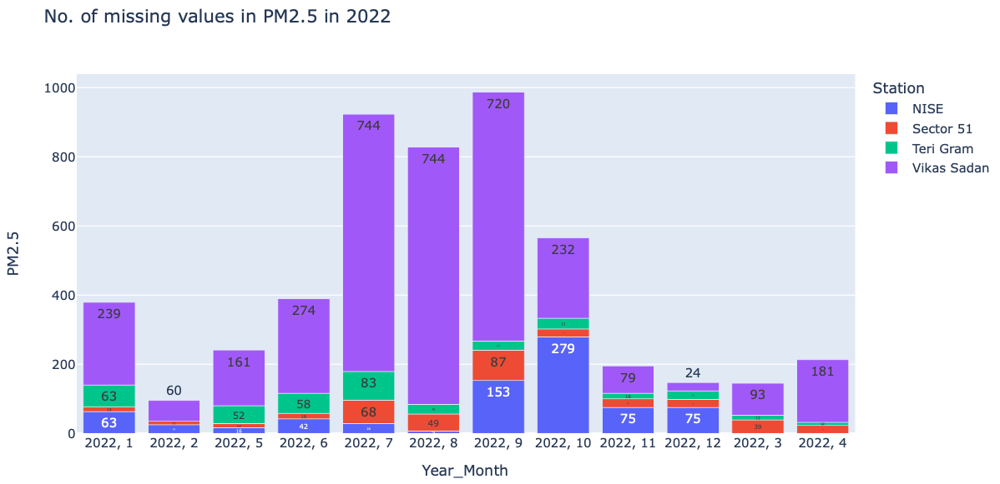

In [35]:
px.line(data_frame=compiled_2022.bfill(), x="Datetime", y="PM2.5", color="Station")

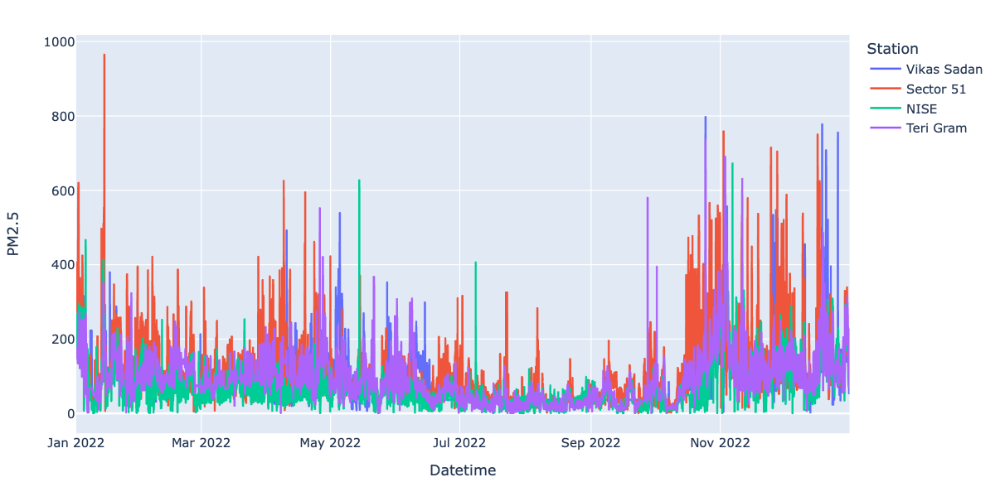

### PM2.5 - 2023

In [36]:
compiled_2023 = compiled[compiled['Year'] == 2023]
compiled_2023
compiled_2023.columns

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
24792,2023-01-01 00:00:00,Vikas Sadan,88.38,12.02,21.48,41.77,3.69,0.92,92.40,2.35,0.0,NaN,NaN,NaN,1,1,2023,52,0
24793,2023-01-01 01:00:00,Vikas Sadan,77.93,12.16,22.59,42.79,3.62,1.26,80.43,2.38,0.0,NaN,NaN,NaN,1,1,2023,52,1
24794,2023-01-01 02:00:00,Vikas Sadan,78.16,11.55,21.59,39.42,3.73,0.86,132.42,2.25,0.0,NaN,NaN,NaN,1,1,2023,52,2
24795,2023-01-01 03:00:00,Vikas Sadan,84.96,11.45,20.96,39.82,3.69,1.28,164.41,2.23,0.0,NaN,NaN,NaN,1,1,2023,52,3
24796,2023-01-01 04:00:00,Vikas Sadan,78.38,11.84,21.06,41.66,3.62,0.91,158.67,3.86,0.0,NaN,NaN,NaN,1,1,2023,52,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107268,2023-03-26 03:00:00,Teri Gram,64.75,16.85,6.92,17.12,18.19,0.90,NaN,6.65,0.0,266.52,NaN,NaN,26,3,2023,12,3
107269,2023-03-26 04:00:00,Teri Gram,88.17,18.63,6.10,18.12,14.92,0.77,23.53,7.52,0.0,285.07,NaN,NaN,26,3,2023,12,4
107270,2023-03-26 05:00:00,Teri Gram,116.45,14.24,5.93,14.52,13.69,0.72,23.54,7.92,0.0,278.62,NaN,NaN,26,3,2023,12,5
107271,2023-03-26 06:00:00,Teri Gram,105.82,12.70,6.06,13.35,14.45,0.66,23.56,7.39,0.0,266.82,NaN,NaN,26,3,2023,12,6


Index(['Datetime', 'Station', 'PM2.5', 'NO', 'NO2', 'NOx', 'SO2', 'CO',
       'Ozone', 'Benzene', 'TOT-RF', 'PM10', 'AQI', 'AQI_Bucket', 'Day',
       'Month', 'Year', 'Week', 'Hour'],
      dtype='object')

In [37]:
col = "PM2.5"
px.bar(data_frame = helper_2(compiled_2023.copy(deep=True), col),
       x = "Year_Month",
       y = col,
       color="Station",
       text_auto = True,
       title = "No. of missing values in "+ col + " in 2023"
       )

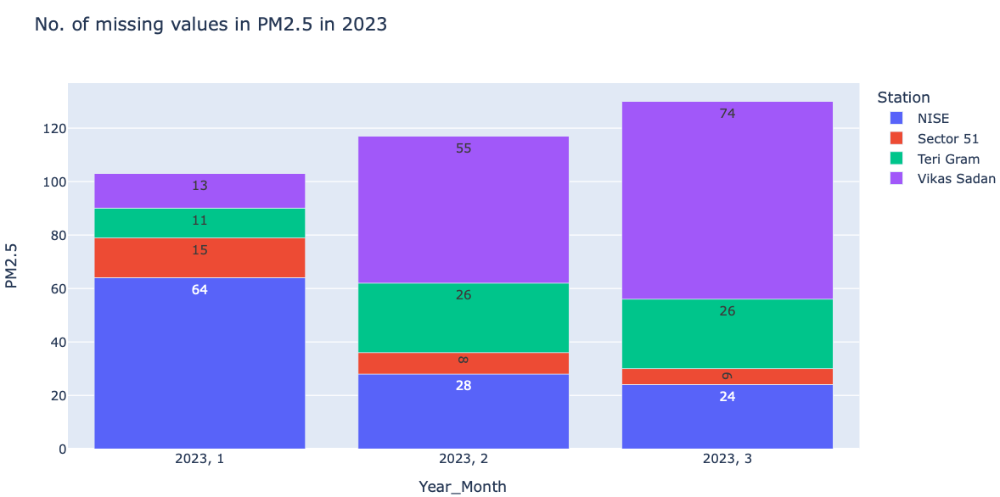

In [38]:
px.line(data_frame=compiled_2023, x="Datetime", y="PM2.5")

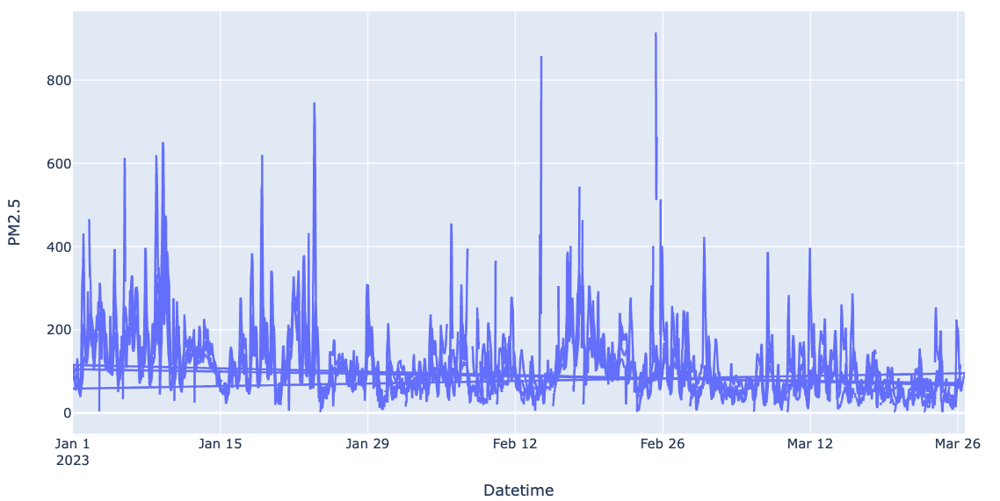

In [39]:
px.line(data_frame=compiled_2023, x="Datetime", y="PM2.5", color="Station")

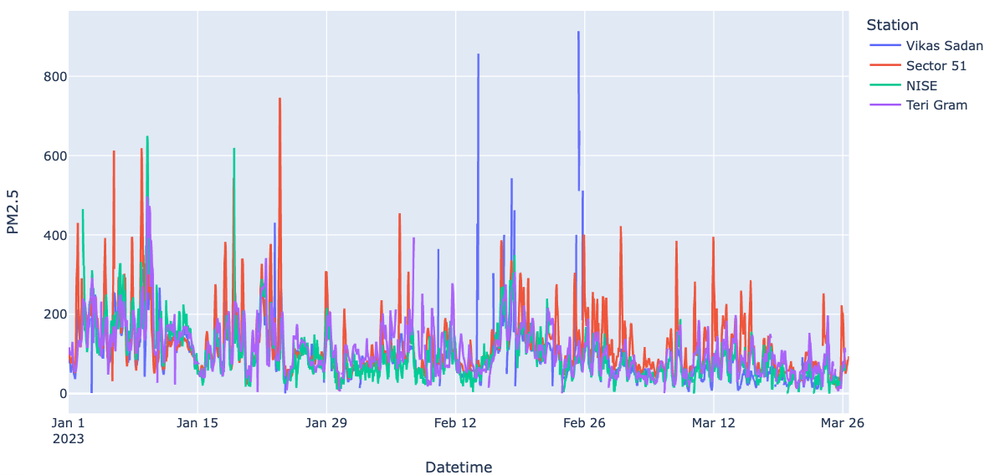

### Filling NA using bfill station wise from Jan 26 to Feb 3 2023

In [40]:
# Jan 26, 2023
compiled[ (compiled['Year'] == 2023) & (compiled['Month'] == 1) & (compiled['Day'] == 26) ].sort_values(['Datetime'])
compiled[ (compiled['Year'] == 2023) & (compiled['Month'] == 1) & (compiled['Day'] == 26) ].index[0]
# compiled[ (compiled['Year'] == 2023) & (compiled['Month'] == 1) & (compiled['Day'] == 26) ]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
25392,2023-01-26 00:00:00,Vikas Sadan,103.59,15.27,32.21,46.12,36.74,0.98,32.42,5.35,0.0,NaN,NaN,NaN,26,1,2023,4,0
105849,2023-01-26 00:00:00,Teri Gram,115.95,3.53,5.87,5.90,0.93,0.77,4.46,5.25,0.0,234.93,NaN,NaN,26,1,2023,4,0
79033,2023-01-26 00:00:00,NISE,93.06,4.76,20.71,25.47,NaN,1.39,7.72,NaN,0.0,139.57,NaN,NaN,26,1,2023,4,0
52208,2023-01-26 00:00:00,Sector 51,104.20,11.84,26.91,23.49,0.68,0.88,8.78,9.56,0.0,192.97,NaN,NaN,26,1,2023,4,0
25393,2023-01-26 01:00:00,Vikas Sadan,100.00,15.22,32.13,45.72,33.28,0.84,31.12,5.32,0.0,NaN,NaN,NaN,26,1,2023,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25414,2023-01-26 22:00:00,Vikas Sadan,102.85,16.13,27.98,36.57,42.60,1.55,38.95,6.21,0.0,NaN,NaN,NaN,26,1,2023,4,22
52231,2023-01-26 23:00:00,Sector 51,112.40,3.66,28.54,17.85,1.29,0.80,28.60,7.65,0.0,208.13,NaN,NaN,26,1,2023,4,23
25415,2023-01-26 23:00:00,Vikas Sadan,93.37,16.53,28.34,35.73,36.00,0.88,41.01,6.29,0.0,NaN,NaN,NaN,26,1,2023,4,23
79056,2023-01-26 23:00:00,NISE,97.26,3.28,16.56,19.84,NaN,0.82,33.58,NaN,0.0,112.96,NaN,NaN,26,1,2023,4,23


25392

In [41]:
# First 30 values

temp = compiled[ (compiled['Year'] == 2023) & (compiled['Month'] == 2)].sort_values(['Station', 'Datetime'])
# temp.sample(30)
temp

temp["PM2.5"].isna().sum()
temp["PM2.5"].value_counts(dropna=False)
temp["PM2.5"].value_counts(dropna=False).index[0]
np.nan
temp[temp["PM2.5"] == temp["PM2.5"].value_counts(dropna=False).index[0]]


,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
79177,2023-02-01 00:00:00,NISE,100.54,3.61,15.37,18.99,NaN,0.36,22.18,NaN,0.0,138.52,NaN,NaN,1,2,2023,5,0
79178,2023-02-01 01:00:00,NISE,69.94,3.63,15.20,18.82,NaN,0.34,25.22,NaN,0.0,122.15,NaN,NaN,1,2,2023,5,1
79179,2023-02-01 02:00:00,NISE,61.33,3.57,14.66,18.23,NaN,0.32,26.54,NaN,0.0,112.52,NaN,NaN,1,2,2023,5,2
79180,2023-02-01 03:00:00,NISE,79.12,3.39,14.64,18.03,NaN,0.31,27.37,NaN,0.0,94.61,NaN,NaN,1,2,2023,5,3
79181,2023-02-01 04:00:00,NISE,45.12,3.50,14.26,17.75,NaN,0.30,30.54,NaN,0.0,79.42,NaN,NaN,1,2,2023,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26203,2023-02-28 19:00:00,Vikas Sadan,51.96,17.34,30.16,47.45,23.31,0.09,32.35,8.79,0.0,NaN,NaN,NaN,28,2,2023,9,19
26204,2023-02-28 20:00:00,Vikas Sadan,54.99,17.41,30.34,48.42,23.01,0.42,35.43,9.02,0.0,NaN,NaN,NaN,28,2,2023,9,20
26205,2023-02-28 21:00:00,Vikas Sadan,51.93,17.23,30.07,47.14,23.61,0.46,35.41,8.72,0.0,NaN,NaN,NaN,28,2,2023,9,21
26206,2023-02-28 22:00:00,Vikas Sadan,55.07,17.18,30.21,47.69,26.84,0.39,43.09,8.21,0.0,NaN,NaN,NaN,28,2,2023,9,22


117

NaN       117
80.12       3
72.95       3
54.00       3
118.07      3
         ... 
158.20      1
70.17       1
75.07       1
77.30       1
53.45       1
Name: PM2.5, Length: 2335, dtype: int64

nan

nan

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour


In [42]:
temp[temp["PM2.5"].isna()].sort_values(['Station', 'Datetime'])[30:60]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
52476,2023-02-06 04:00:00,Sector 51,NaN,NaN,NaN,0.00,NaN,0.00,NaN,0.00,0.0,NaN,NaN,NaN,6,2,2023,6,4
52477,2023-02-06 05:00:00,Sector 51,NaN,NaN,NaN,0.00,NaN,0.00,NaN,0.00,0.0,NaN,NaN,NaN,6,2,2023,6,5
52778,2023-02-18 18:00:00,Sector 51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,18,2,2023,7,18
52799,2023-02-19 15:00:00,Sector 51,NaN,NaN,NaN,0.00,NaN,0.00,NaN,0.00,0.0,NaN,NaN,NaN,19,2,2023,7,15
52893,2023-02-23 13:00:00,Sector 51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,23,2,2023,8,13
52915,2023-02-24 11:00:00,Sector 51,NaN,0.54,28.55,15.35,2.25,0.55,36.27,NaN,0.0,NaN,NaN,NaN,24,2,2023,8,11
106102,2023-02-05 13:00:00,Teri Gram,NaN,4.50,6.59,6.25,14.30,0.56,9.66,4.90,0.0,NaN,NaN,NaN,5,2,2023,5,13
106103,2023-02-05 14:00:00,Teri Gram,NaN,4.04,6.47,5.82,14.21,0.52,10.53,8.24,0.0,NaN,NaN,NaN,5,2,2023,5,14
106104,2023-02-05 15:00:00,Teri Gram,NaN,3.80,5.76,5.25,14.02,0.47,10.65,1.83,0.0,NaN,NaN,NaN,5,2,2023,5,15
106127,2023-02-06 14:00:00,Teri Gram,NaN,3.80,6.22,5.49,15.88,0.56,11.42,4.15,0.0,NaN,NaN,NaN,6,2,2023,6,14


In [43]:
temp[temp["PM2.5"].isna()].sort_values(['Station', 'Datetime'])[28:50]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
52474,2023-02-06 02:00:00,Sector 51,NaN,NaN,NaN,0.00,NaN,0.00,NaN,0.00,0.0,NaN,NaN,NaN,6,2,2023,6,2
52475,2023-02-06 03:00:00,Sector 51,NaN,NaN,NaN,0.00,NaN,0.00,NaN,0.00,0.0,NaN,NaN,NaN,6,2,2023,6,3
52476,2023-02-06 04:00:00,Sector 51,NaN,NaN,NaN,0.00,NaN,0.00,NaN,0.00,0.0,NaN,NaN,NaN,6,2,2023,6,4
52477,2023-02-06 05:00:00,Sector 51,NaN,NaN,NaN,0.00,NaN,0.00,NaN,0.00,0.0,NaN,NaN,NaN,6,2,2023,6,5
52778,2023-02-18 18:00:00,Sector 51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,18,2,2023,7,18
52799,2023-02-19 15:00:00,Sector 51,NaN,NaN,NaN,0.00,NaN,0.00,NaN,0.00,0.0,NaN,NaN,NaN,19,2,2023,7,15
52893,2023-02-23 13:00:00,Sector 51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,23,2,2023,8,13
52915,2023-02-24 11:00:00,Sector 51,NaN,0.54,28.55,15.35,2.25,0.55,36.27,NaN,0.0,NaN,NaN,NaN,24,2,2023,8,11
106102,2023-02-05 13:00:00,Teri Gram,NaN,4.50,6.59,6.25,14.30,0.56,9.66,4.90,0.0,NaN,NaN,NaN,5,2,2023,5,13
106103,2023-02-05 14:00:00,Teri Gram,NaN,4.04,6.47,5.82,14.21,0.52,10.53,8.24,0.0,NaN,NaN,NaN,5,2,2023,5,14


In [44]:
temp[temp["PM2.5"].isna()].sort_values(['Datetime'])['Station'].unique()

array(['Vikas Sadan', 'Teri Gram', 'Sector 51', 'NISE'], dtype=object)

In [45]:
temp[temp["PM2.5"].isna()].sample(30)

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
106339,2023-02-15 10:00:00,Teri Gram,NaN,2.32,9.16,5.84,NaN,0.74,12.88,4.19,0.0,30.00,NaN,NaN,15,2,2023,7,10
26162,2023-02-27 02:00:00,Vikas Sadan,NaN,23.47,53.72,68.56,NaN,NaN,NaN,4.67,0.0,NaN,NaN,NaN,27,2,2023,9,2
26176,2023-02-27 16:00:00,Vikas Sadan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,27,2,2023,9,16
25929,2023-02-17 09:00:00,Vikas Sadan,NaN,25.60,29.77,45.75,9.46,2.49,35.77,5.82,0.0,NaN,NaN,NaN,17,2,2023,7,9
106152,2023-02-07 15:00:00,Teri Gram,NaN,5.16,5.38,6.14,10.42,0.51,9.97,4.15,0.0,NaN,NaN,NaN,7,2,2023,6,15
106158,2023-02-07 21:00:00,Teri Gram,NaN,3.36,5.81,4.94,16.92,0.46,10.39,4.18,0.0,NaN,NaN,NaN,7,2,2023,6,21
106654,2023-02-28 13:00:00,Teri Gram,NaN,11.56,11.07,15.05,0.47,0.61,24.63,6.61,0.0,163.05,NaN,NaN,28,2,2023,9,13
79689,2023-02-22 08:00:00,NISE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,22,2,2023,8,8
79691,2023-02-22 10:00:00,NISE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,22,2,2023,8,10
26161,2023-02-27 01:00:00,Vikas Sadan,NaN,22.61,54.22,69.82,NaN,NaN,NaN,4.22,0.0,NaN,NaN,NaN,27,2,2023,9,1


In [46]:
temp.loc[26132,"PM2.5"]
repr(temp.loc[26132,"PM2.5"])
temp.loc[26132,"PM2.5"].dtype
repr(temp.loc[26132,"PM2.5"]) == repr(np.nan) #WORKS :))

nan

'nan'

dtype('float64')

True

In [47]:
# Feb 3, 2023
compiled[ (compiled['Year'] == 2023) & (compiled['Month'] == 2) & (compiled['Day'] == 3) ].sort_values(['Datetime'])
compiled[ (compiled['Year'] == 2023) & (compiled['Month'] == 2) & (compiled['Day'] == 3) ].index[0]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
25584,2023-02-03 00:00:00,Vikas Sadan,86.95,16.23,30.24,46.24,7.31,0.56,41.89,6.21,0.0,NaN,NaN,NaN,3,2,2023,5,0
106041,2023-02-03 00:00:00,Teri Gram,80.95,2.62,5.83,4.34,11.91,0.50,10.04,7.83,0.0,170.60,NaN,NaN,3,2,2023,5,0
79225,2023-02-03 00:00:00,NISE,30.90,3.03,16.80,19.83,NaN,0.37,49.79,NaN,0.0,101.29,NaN,NaN,3,2,2023,5,0
52400,2023-02-03 00:00:00,Sector 51,108.62,7.36,33.23,23.30,3.68,0.84,8.70,7.97,0.0,201.08,NaN,NaN,3,2,2023,5,0
25585,2023-02-03 01:00:00,Vikas Sadan,81.08,16.26,30.38,47.88,7.29,1.11,43.15,6.24,0.0,NaN,NaN,NaN,3,2,2023,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25606,2023-02-03 22:00:00,Vikas Sadan,140.44,17.19,29.73,46.95,7.15,2.71,52.98,8.41,0.0,NaN,NaN,NaN,3,2,2023,5,22
52423,2023-02-03 23:00:00,Sector 51,236.10,64.89,36.20,70.95,4.13,1.81,30.13,13.24,0.0,437.00,NaN,NaN,3,2,2023,5,23
25607,2023-02-03 23:00:00,Vikas Sadan,162.26,17.28,31.10,47.32,7.24,0.46,47.87,8.45,0.0,NaN,NaN,NaN,3,2,2023,5,23
79248,2023-02-03 23:00:00,NISE,111.26,8.54,24.21,32.76,NaN,1.02,0.47,NaN,0.0,170.73,NaN,NaN,3,2,2023,5,23


25584

In [48]:
compiled[ (compiled['Year'] == 2023) & (compiled['Month'] == 1) ].sort_values(['Datetime'])[30:60]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
51615,2023-01-01 07:00:00,Sector 51,77.25,16.01,25.52,26.17,2.35,0.79,26.56,3.57,0.0,143.10,NaN,NaN,1,1,2023,52,7
105256,2023-01-01 07:00:00,Teri Gram,100.80,67.78,10.93,60.07,17.85,0.89,10.02,7.19,0.0,177.35,NaN,NaN,1,1,2023,52,7
78441,2023-01-01 08:00:00,NISE,NaN,9.50,27.94,37.42,NaN,0.48,3.74,NaN,0.0,111.33,NaN,NaN,1,1,2023,52,8
51616,2023-01-01 08:00:00,Sector 51,80.80,17.08,28.54,28.61,5.07,0.81,21.85,3.35,0.0,149.65,NaN,NaN,1,1,2023,52,8
24800,2023-01-01 08:00:00,Vikas Sadan,64.77,23.43,20.35,63.06,5.09,0.98,10.39,6.19,0.0,NaN,NaN,NaN,1,1,2023,52,8
105257,2023-01-01 08:00:00,Teri Gram,107.53,59.19,11.26,53.35,19.51,0.84,9.79,6.12,0.0,166.65,NaN,NaN,1,1,2023,52,8
78442,2023-01-01 09:00:00,NISE,NaN,12.78,41.89,54.68,NaN,0.57,9.32,NaN,0.0,157.17,NaN,NaN,1,1,2023,52,9
51617,2023-01-01 09:00:00,Sector 51,94.38,14.58,29.90,26.79,6.28,0.84,29.81,3.52,0.0,174.75,NaN,NaN,1,1,2023,52,9
24801,2023-01-01 09:00:00,Vikas Sadan,64.72,23.49,20.36,61.99,5.18,1.10,12.76,6.20,0.0,NaN,NaN,NaN,1,1,2023,52,9
105258,2023-01-01 09:00:00,Teri Gram,109.80,52.21,17.31,50.91,19.93,0.85,10.44,6.12,0.0,215.48,NaN,NaN,1,1,2023,52,9


In [49]:
compiled[ (compiled['Year'] == 2023) & (compiled['Month'] == 2) & (compiled['Day'] == 3) ].sort_values(['Station','Datetime'])[60:]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
106053,2023-02-03 12:00:00,Teri Gram,102.30,5.94,7.27,7.76,8.53,0.60,9.52,6.33,0.0,237.47,NaN,NaN,3,2,2023,5,12
106054,2023-02-03 13:00:00,Teri Gram,94.72,5.11,6.92,6.91,8.06,0.57,10.24,6.01,0.0,198.47,NaN,NaN,3,2,2023,5,13
106055,2023-02-03 14:00:00,Teri Gram,85.47,4.54,6.78,6.37,7.75,0.54,11.19,5.90,0.0,160.55,NaN,NaN,3,2,2023,5,14
106056,2023-02-03 15:00:00,Teri Gram,82.08,3.42,6.23,5.19,7.76,0.47,10.77,5.57,0.0,169.12,NaN,NaN,3,2,2023,5,15
106057,2023-02-03 16:00:00,Teri Gram,69.75,2.67,6.71,4.84,4.23,0.47,10.64,4.63,0.0,142.28,NaN,NaN,3,2,2023,5,16
106058,2023-02-03 17:00:00,Teri Gram,70.28,2.44,6.46,4.53,3.95,0.48,10.59,4.55,0.0,150.72,NaN,NaN,3,2,2023,5,17
106059,2023-02-03 18:00:00,Teri Gram,65.42,2.49,6.99,4.85,3.79,0.52,10.52,4.60,0.0,152.35,NaN,NaN,3,2,2023,5,18
106060,2023-02-03 19:00:00,Teri Gram,59.05,5.21,7.37,7.23,3.90,0.83,10.24,4.63,0.0,192.07,NaN,NaN,3,2,2023,5,19
106061,2023-02-03 20:00:00,Teri Gram,92.05,8.38,7.58,9.88,9.08,0.98,9.86,4.96,0.0,327.65,NaN,NaN,3,2,2023,5,20
106062,2023-02-03 21:00:00,Teri Gram,152.22,9.56,6.95,10.50,9.64,1.00,10.09,5.24,0.0,409.85,NaN,NaN,3,2,2023,5,21


In [50]:
x = compiled[ (compiled['Year'] == 2023) & (compiled['Month'] == 2) & (compiled['Day'] == 28) ].sort_values(['Station','Datetime'])
x[x["PM2.5"].isna()]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
106653,2023-02-28 12:00:00,Teri Gram,NaN,13.89,14.05,18.48,NaN,0.69,25.67,7.29,0.0,NaN,NaN,NaN,28,2,2023,9,12
106654,2023-02-28 13:00:00,Teri Gram,NaN,11.56,11.07,15.05,0.47,0.61,24.63,6.61,0.0,163.05,NaN,NaN,28,2,2023,9,13
26195,2023-02-28 11:00:00,Vikas Sadan,NaN,47.67,41.16,55.93,16.76,1.81,65.62,5.72,0.0,NaN,NaN,NaN,28,2,2023,9,11
26196,2023-02-28 12:00:00,Vikas Sadan,NaN,17.35,30.27,47.43,11.85,4.93,49.60,5.79,0.0,NaN,NaN,NaN,28,2,2023,9,12


In [51]:
y = x[40:80]
y["PM2.5"].bfill(inplace=True)
y

/var/folders/27/b03t8q596qvcmtyqjtnh0w6w0000gn/T/ipykernel_28327/2576939870.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
53016,2023-02-28 16:00:00,Sector 51,96.70,4.20,28.10,16.45,3.08,0.54,57.37,10.99,0.0,179.10,NaN,NaN,28,2,2023,9,16
53017,2023-02-28 17:00:00,Sector 51,105.72,5.09,28.89,17.58,3.25,0.50,29.73,10.50,0.0,195.72,NaN,NaN,28,2,2023,9,17
53018,2023-02-28 18:00:00,Sector 51,96.40,5.52,30.57,18.60,3.16,0.49,27.86,9.73,0.0,178.55,NaN,NaN,28,2,2023,9,18
53019,2023-02-28 19:00:00,Sector 51,104.45,5.97,30.49,19.12,3.22,0.50,29.91,9.54,0.0,193.52,NaN,NaN,28,2,2023,9,19
53020,2023-02-28 20:00:00,Sector 51,106.23,7.82,29.36,20.00,1.96,0.51,28.52,10.04,0.0,196.75,NaN,NaN,28,2,2023,9,20
53021,2023-02-28 21:00:00,Sector 51,115.35,11.02,28.66,21.80,1.80,0.55,25.37,9.88,0.0,213.65,NaN,NaN,28,2,2023,9,21
53022,2023-02-28 22:00:00,Sector 51,138.03,12.84,28.09,23.37,1.64,0.56,24.53,9.54,0.0,255.60,NaN,NaN,28,2,2023,9,22
53023,2023-02-28 23:00:00,Sector 51,137.13,13.54,27.78,23.76,1.83,0.57,22.37,8.98,0.0,253.93,NaN,NaN,28,2,2023,9,23
106641,2023-02-28 00:00:00,Teri Gram,103.27,21.74,11.94,23.67,7.78,0.85,24.69,9.91,0.0,283.30,NaN,NaN,28,2,2023,9,0
106642,2023-02-28 01:00:00,Teri Gram,99.43,22.47,10.53,23.52,8.42,0.86,25.83,10.87,0.0,248.38,NaN,NaN,28,2,2023,9,1


In [52]:
compiled

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,TOT-RF,PM10,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
0,2020-03-04 00:00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.50,3.01,5.08,2.04,0.0,NaN,NaN,NaN,4,3,2020,10,0
1,2020-03-04 01:00:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,2.00,0.0,NaN,NaN,NaN,4,3,2020,10,1
2,2020-03-04 02:00:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.60,1.85,12.72,2.02,0.0,NaN,NaN,NaN,4,3,2020,10,2
3,2020-03-04 03:00:00,Vikas Sadan,67.60,377.93,29.18,317.53,10.53,1.31,11.46,1.96,0.0,NaN,NaN,NaN,4,3,2020,10,3
4,2020-03-04 04:00:00,Vikas Sadan,72.72,319.80,33.66,273.25,9.98,0.63,4.76,2.01,0.0,NaN,NaN,NaN,4,3,2020,10,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147526,2020-06-30 20:00:00,No Station,54.74,6.23,10.67,12.60,4.18,0.60,NaN,2.14,NaN,135.42,154.0,Moderate,30,6,2020,27,20
147527,2020-06-30 21:00:00,No Station,54.37,6.30,10.28,11.88,4.03,1.20,NaN,1.87,NaN,136.11,154.0,Moderate,30,6,2020,27,21
147528,2020-06-30 22:00:00,No Station,50.34,6.93,10.36,13.01,6.17,1.00,NaN,2.41,NaN,147.32,155.0,Moderate,30,6,2020,27,22
147529,2020-06-30 23:00:00,No Station,53.23,6.64,10.30,12.75,6.31,0.86,NaN,2.54,NaN,163.15,156.0,Moderate,30,6,2020,27,23


In [53]:
# Save the file

# compiled.to_csv('../../data/preprocessing_data/compiled_part_2_end.csv')